# Homework 2 (100 Points)

The goal of this homework is to get more practice with clustering and SVD on various datasets.

## Exercise 1 - (50 points)

This exercise will be using the [AirBnB dataset](http://insideairbnb.com/get-the-data.html) for New York City called `listings.csv`. You should find this data in your downloaded repository. If not, it is a resource under Piazza.

a) Produce a [Marker Cluster](https://deparkes.co.uk/2016/06/24/folium-marker-clusters/) using the Folium and Selenium package (you can install them using pip) of the mean listing price per location (lattitude and longitude) over the New York City map. (5 points)

To start, generate a base map of New York City to plot over: (**`location=[40.693943, -73.985880], zoom_start = 11`**). Then, generate and save a `PNG` file named `problem1a.png`. Display it in the cell below as well using the `IPython.display` package.

In [7]:
# Do not edit this cell
import pandas as pd
import numpy as np
import folium #install if you haven't already
import selenium #install if you haven't already
from IPython.display import Image #install if you haven't already

def convert_map_to_png(map, filename):
    """
    Method to convert a folium map to a png file by
    saving the map as an html file and then taking a
    screenshot of the html file on the browser.

    map : folium map object
        The map to be converted to a png file
    filename : str, does not include file type
    """
    import os
    import time
    from selenium import webdriver

    html_filename=f'{filename}.html'
    map.save(html_filename)

    tmpurl=f'file://{os.getcwd()}/{html_filename}'
    
    try:
        try:
            browser = webdriver.Firefox()
        except:
            browser = webdriver.Chrome()
    except:
        browser = webdriver.Safari()

    browser.get(tmpurl)
    time.sleep(5)
    browser.save_screenshot(f'{filename}.png')
    browser.quit()
    os.remove(html_filename)

    return Image(f'{filename}.png')

/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3194: DtypeWarning: Columns (17) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


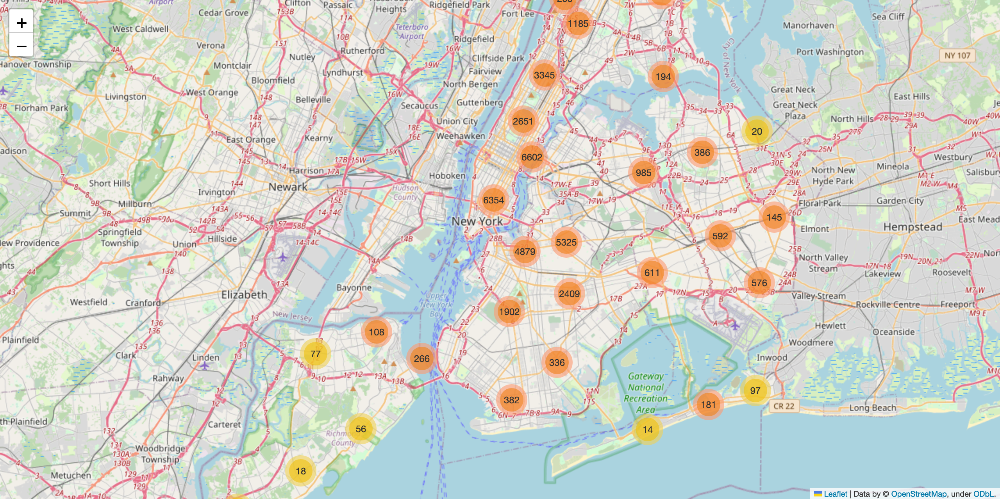

In [8]:
from folium.plugins import MarkerCluster, FastMarkerCluster #Using either is fine but I prefer FastMarkerCluster.


# Write your code below! Leave the instantiated variables: it is for your convenience.
listings = pd.read_csv('listings.csv')
nyc_map = folium.Map(location=[40.693943, -73.985880], zoom_start=11)

cluster = MarkerCluster().add_to(nyc_map)
for _, row in listings.groupby(['latitude', 'longitude']).mean().reset_index().iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=str(row['price']),
    ).add_to(cluster)

convert_map_to_png(nyc_map, 'problem1a')


b) Plot a bar chart of the average price per neighbourhood group. Briefly comment on the relation between the price and neighbourhood group (use your map to analyze it). - (2.5 pts)

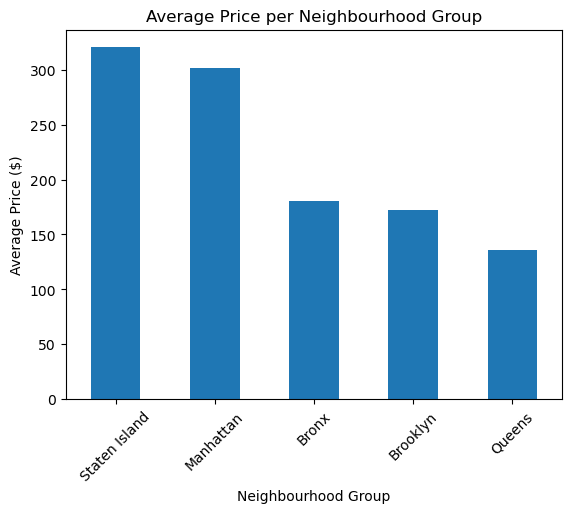

In [9]:

avg_price = listings.groupby('neighbourhood_group')['price'].mean()

import matplotlib.pyplot as plt
avg_price.sort_values(ascending=False).plot(kind='bar')
plt.title('Average Price per Neighbourhood Group')
plt.ylabel('Average Price ($)')
plt.xlabel('Neighbourhood Group')
plt.xticks(rotation=45)
plt.show()

Both Island neighborhoods have a much higher average price.

c) You're going to be living in New York City long term so you'd like to find places you can stay that are at minimum 300 days (inclusive). Plot a map that displays all the locations of these places. (Note: some could be in the same location) - (5 pts)


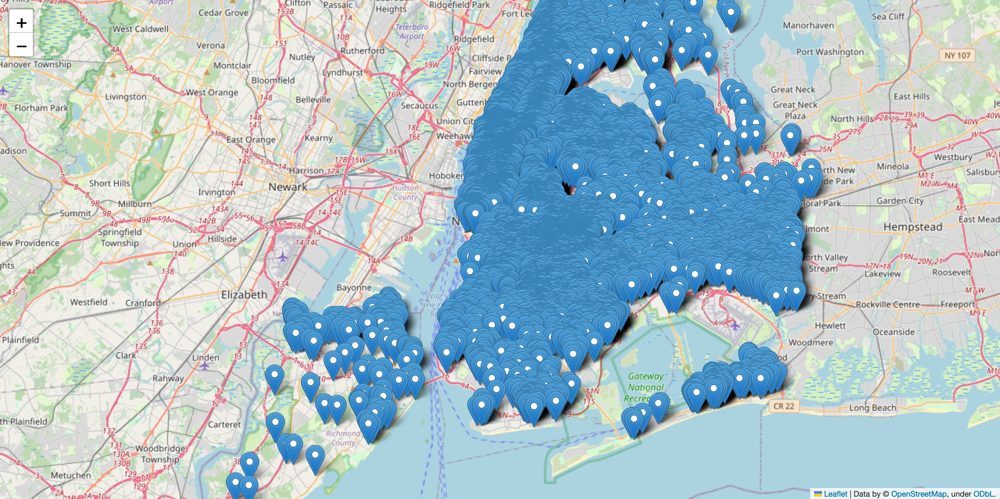

In [6]:
# Write your code below! Leave the instantiated variables: it is for your convenience.
available_listings = listings[listings['availability_365'] >= 300]
nyc_map_2 =folium.Map(location=[40.693943, -73.985880], zoom_start=11)

for _, row in available_listings.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"Price: ${row['price']} \nAvailability: {row['availability_365']} days",
    ).add_to(nyc_map_2)



convert_map_to_png(nyc_map_2, 'problem1c')

d) Using `longitude`, `latitude`, `price`, and `number_of_reviews`, use Density-based clustering to create clusters. Plot the points on the NYC map in a color corresponding to their cluster (color could be randomly assigned, but ensure each datapoint is colored to its associated cluster). 
For using `DBSCAN`, have the settings **`eps=0.3, min_samples=10`**. Use a `CircleMarker` with `radius=1`. Plot the clusters on the map and print the number of clusters made. - (15 pts)

Number of clusters: 628


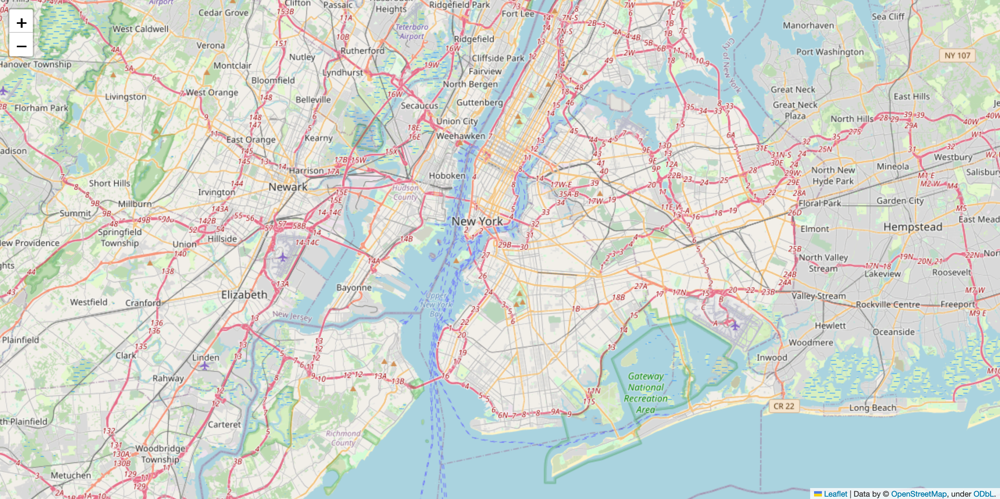

In [11]:
# Write your code below! Leave the instantiated variables: it is for your convenience.
from sklearn.cluster import DBSCAN

data = listings[['longitude', 'latitude', 'price', 'number_of_reviews']].values
db = DBSCAN(eps=0.3, min_samples=10).fit(data)
labels = db.labels_

#print number of clusters
n_clusters = len(set(labels))
print(f"Number of clusters: {n_clusters}")

nyc_map3 = folium.Map(location=[40.693943, -73.985880], zoom_start=11)


convert_map_to_png(nyc_map3, 'problem1d')

e) What would happen if you were to increase/decrease `eps`, and what would happen if you were to increase/decrease `min_samples`? Give some examples when running part d (you don't have to give the map image, just say something such as "When testing part d with ... ") - (5 points)

Increasing eps will increase the size of the neighborhoods, meaning less but bigger clusters.

Decreasing eps will decrease the size of the neighborhoods, meaning more but smaller clusters.

Increasing min_samples will lead to denser clusters.

Decreasing min_samples will lead to more sparse clusters.

f) For part d, were the clusters seemed to be scattered or grouped together? Justify your answer. - (2.5 points)

More Scattered, as eps is lower and min_samples is higher.

g) For all listings of type `Shared room`, plot the dendrogram of the hierarchical clustering generated from `longitude`, `latitude`, and `price`. You can use any distance function. Describe your findings. - (10 points)

{'icoord': [[15.0, 15.0, 25.0, 25.0],
  [35.0, 35.0, 45.0, 45.0],
  [20.0, 20.0, 40.0, 40.0],
  [65.0, 65.0, 75.0, 75.0],
  [85.0, 85.0, 95.0, 95.0],
  [70.0, 70.0, 90.0, 90.0],
  [55.0, 55.0, 80.0, 80.0],
  [30.0, 30.0, 67.5, 67.5],
  [5.0, 5.0, 48.75, 48.75]],
 'dcoord': [[0.0, 434.3946215977787, 434.3946215977787, 0.0],
  [0.0, 643.9092662301431, 643.9092662301431, 0.0],
  [434.3946215977787,
   1442.2625622362946,
   1442.2625622362946,
   643.9092662301431],
  [0.0, 455.6051087601385, 455.6051087601385, 0.0],
  [0.0, 727.076471807879, 727.076471807879, 0.0],
  [455.6051087601385, 1748.22740669381, 1748.22740669381, 727.076471807879],
  [0.0, 3656.495624698614, 3656.495624698614, 1748.22740669381],
  [1442.2625622362946,
   5768.380666791282,
   5768.380666791282,
   3656.495624698614],
  [0.0, 13963.780602832674, 13963.780602832674, 5768.380666791282]],
 'ivl': ['211',
  '(17)',
  '(48)',
  '(208)',
  '(233)',
  '(4)',
  '(2)',
  '(4)',
  '(4)',
  '(11)'],
 'leaves': [211, 1046, 1

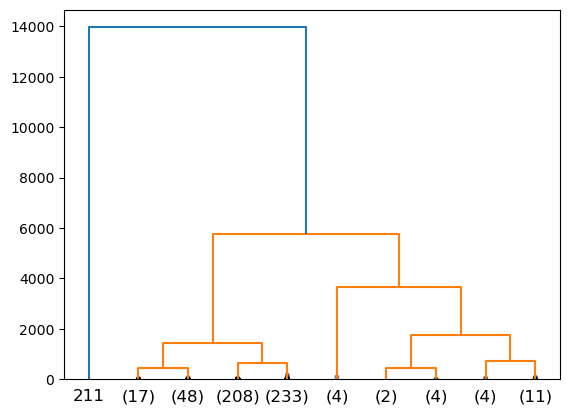

In [13]:
from scipy.cluster import hierarchy

shared_room_data = listings[listings['room_type'] == 'Shared room'][['longitude', 'latitude', 'price']]

linkage = hierarchy.linkage(shared_room_data, method='ward')
hierarchy.dendrogram(linkage, truncate_mode='lastp', p=10, show_contracted=True)


h) Normalize `longitude`, `latitude`, and `price` by subtracting by the mean (of the column) and dividing by the standard deviation (of the column). Repeat g) using the normalized data. Comment on what you observe. - (5 points)

{'icoord': [[15.0, 15.0, 25.0, 25.0],
  [45.0, 45.0, 55.0, 55.0],
  [35.0, 35.0, 50.0, 50.0],
  [20.0, 20.0, 42.5, 42.5],
  [65.0, 65.0, 75.0, 75.0],
  [85.0, 85.0, 95.0, 95.0],
  [70.0, 70.0, 90.0, 90.0],
  [31.25, 31.25, 80.0, 80.0],
  [5.0, 5.0, 55.625, 55.625]],
 'dcoord': [[0.0, 11.236534461958867, 11.236534461958867, 0.0],
  [0.0, 7.236721761868328, 7.236721761868328, 0.0],
  [0.0, 11.385122490256842, 11.385122490256842, 7.236721761868328],
  [11.236534461958867,
   15.808255899656821,
   15.808255899656821,
   11.385122490256842],
  [0.0, 8.395586365267762, 8.395586365267762, 0.0],
  [0.0, 9.14014996317318, 9.14014996317318, 0.0],
  [8.395586365267762,
   22.837112779010383,
   22.837112779010383,
   9.14014996317318],
  [15.808255899656821,
   26.74605848665563,
   26.74605848665563,
   22.837112779010383],
  [0.0, 28.87771957183789, 28.87771957183789, 26.74605848665563]],
 'ivl': ['211',
  '(4)',
  '(110)',
  '(18)',
  '(118)',
  '(29)',
  '(13)',
  '(160)',
  '(49)',
  '(30)'

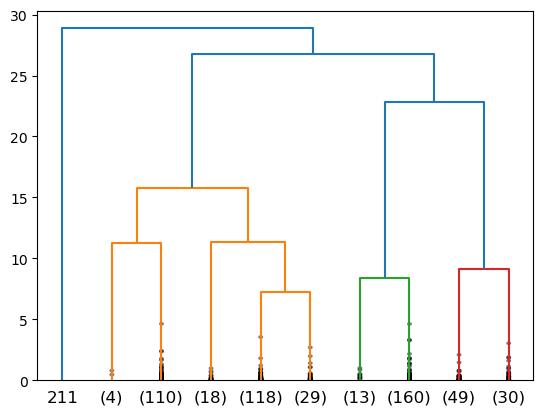

In [14]:
cols = ['longitude', 'latitude', 'price']

for col in cols:
    mean_val = shared_room_data[col].mean()
    std_val = shared_room_data[col].std()
    shared_room_data[col] = (shared_room_data[col] - mean_val) / std_val
    
linkage = hierarchy.linkage(shared_room_data, method='ward')
hierarchy.dendrogram(linkage, truncate_mode='lastp', p=10, show_contracted=True)

## Exercise 2 (50 points)

a) Fetch the "mnist_784" data and store is as a `.csv` (that way you don't have to fetch it every time - which takes about 30s). (2.5 points)

In [16]:
import matplotlib.pyplot as plt

from sklearn.datasets import fetch_openml

X, y = fetch_openml(name="mnist_784", version=1, return_X_y=True, as_frame=False)

# your code here
mnist_df = pd.DataFrame(X)
mnist_df['target'] = y

mnist_df.to_csv('mnist_784.csv', index=False)

b) Plot the singular value plot for a single example of the 9 digit (2.5 points)

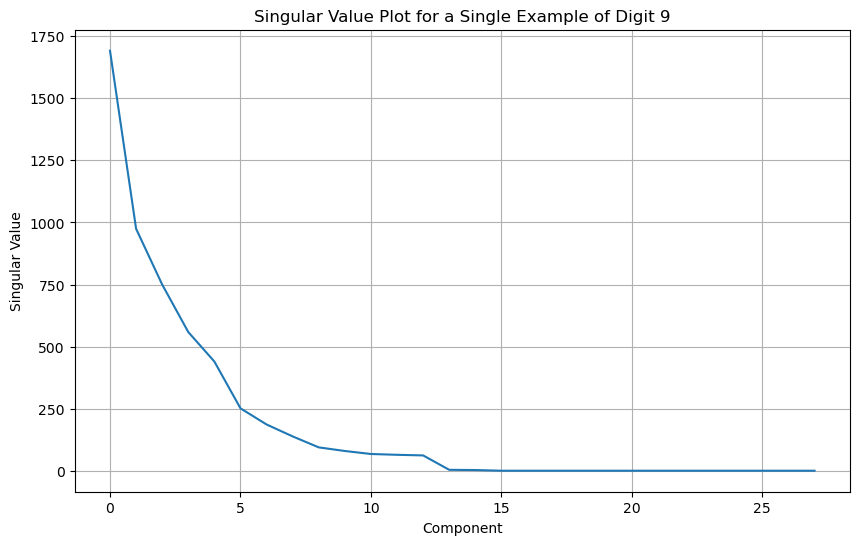

In [21]:

nine = X[y == '9'][0].reshape(28, 28)
U, singular_values, Vt = np.linalg.svd(nine)

plt.figure(figsize=(10, 6))
plt.plot(singular_values)
plt.title("Singular Value Plot for a Single Example of the 9 Digit")
plt.xlabel("Component")
plt.ylabel("Singular Value")
plt.grid(True)
plt.show()

c) Just like we did in class with the image of the boat: By setting some singular values to 0, plot the approximation of an image of a 9 digit next to the original image. (5 points)

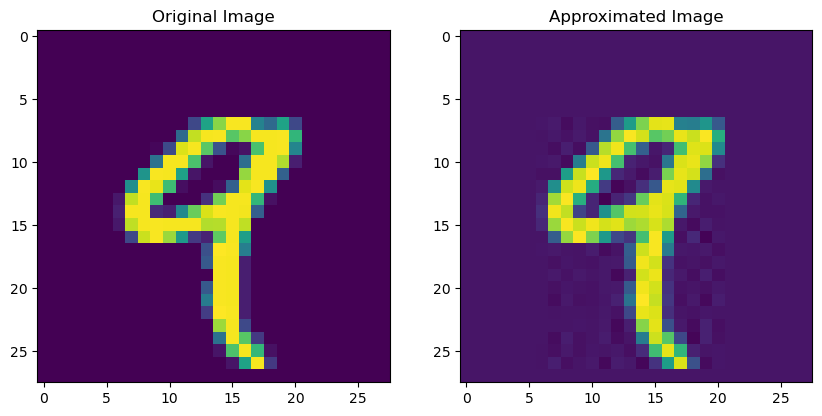

In [28]:
approx_singular_values = singular_values.copy()
approx_singular_values[10:] = 0


# approximated singular values
S_approx = np.zeros(nine.shape)
for i in range(len(approx_singular_values)):
    S_approx[i, i] = approx_singular_values[i]

# Reconstruct the approximated image
approx_image = np.dot(U, np.dot(S_approx, Vt))



plt.figure(figsize=(10, 5))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(nine)
plt.title('Original Image')

# Approximated image
plt.subplot(1, 2, 2)
plt.imshow(approx_image)
plt.title('Approximated Image')

plt.show()

d) Consider the entire dataset as a matrix. Perform SVD and explain why / how you chose a particular rank. Note: you may not be able to run this on the entire dataset in a reasonable amount of time so you may take a small random sample for this and the following questions. (5 points)

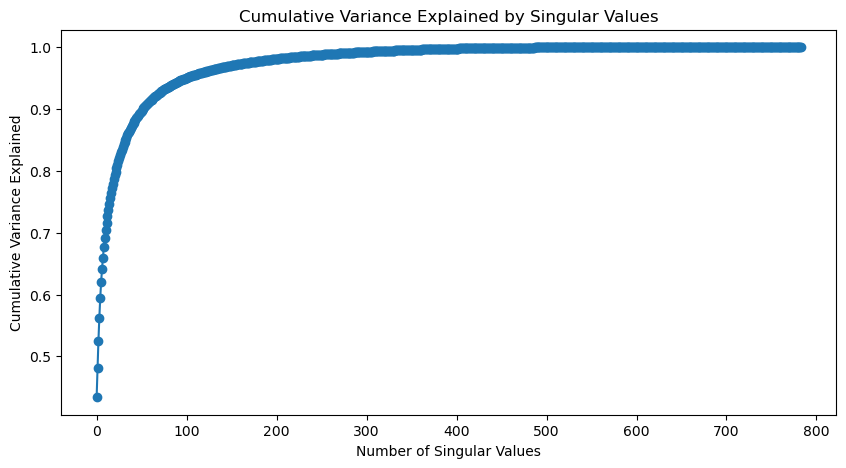

In [32]:
sample_indices = np.random.choice(X.shape[0], 5000, replace=False)
X_sample = X[sample_indices]

# SVD
U, singular_values, Vt = np.linalg.svd(X_sample, full_matrices=False)
var_explained = np.cumsum(singular_values**2) / np.sum(singular_values**2)


plt.figure(figsize=(10, 5))
plt.plot(var_explained, '-o')
plt.xlabel('Number of Singular Values')
plt.ylabel('Cumulative Variance Explained')
plt.title('Cumulative Variance Explained by Singular Values')
plt.show()

e) Plot the first 10 singular vectors. Notice that each singular vector's length will be 784 so you can plot them as a 28x28 image. (5points)

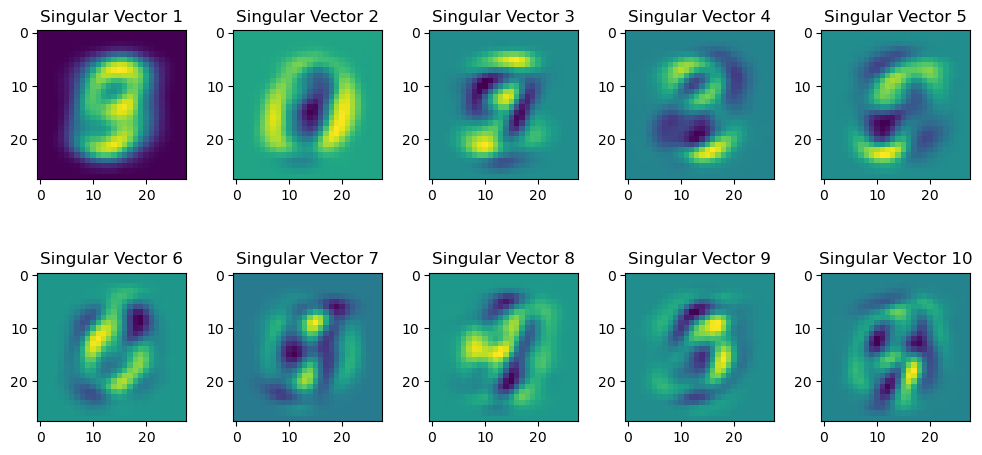

In [36]:
U, singular_values, Vt = np.linalg.svd(X_sample, full_matrices=False)


plt.figure(figsize=(10, 5))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(Vt[i].reshape(28, 28))
    plt.title(f'Singular Vector {i+1}')


plt.tight_layout()
plt.show()

f) Using Kmeans on this new dataset, cluster the images from d) using 10 clusters and plot the centroid of each cluster. Note: the centroids should be represented as images. (10 points)

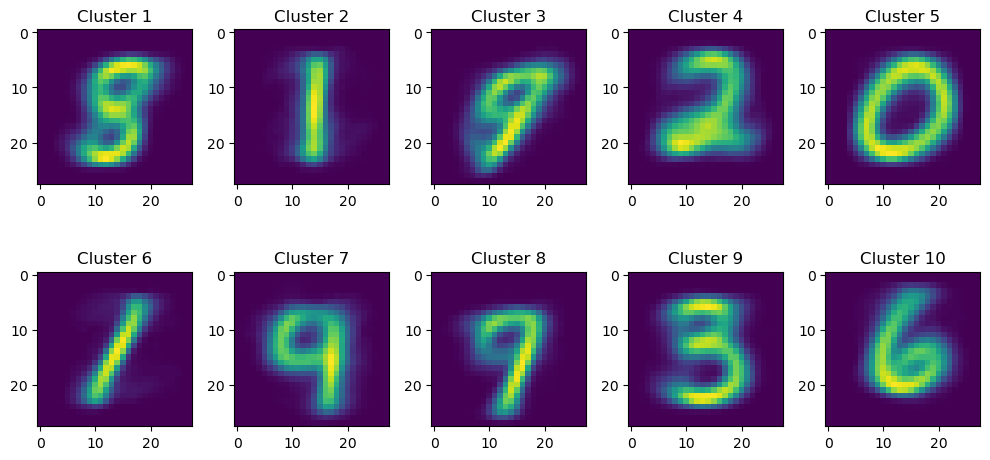

In [37]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=10, random_state=42)
kmeans.fit(X_sample)

centroids = kmeans.cluster_centers_

plt.figure(figsize=(10, 5))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(centroids[i].reshape(28, 28))
    plt.title(f'Cluster {i+1}')

plt.tight_layout()
plt.show()


g) Repeat f) on the original dataset (if you used a subset of the dataset, keep using that same subset). Comment on any differences (or lack thereof) you observe between the centroids. (5 points)

h) Create a matrix (let's call it `O`) that is the difference between the original dataset and the rank-10 approximation of the dataset. (5 points)

In [38]:
rank_10_singular_values = np.zeros_like(singular_values)
rank_10_singular_values[:10] = singular_values[:10]

S_10 = np.diag(rank_10_singular_values)

X_approx_10 = np.dot(U, np.dot(S_10, Vt))

O = X_sample - X_approx_10


i) The largest (using euclidean distance from the origin) rows of the matrix `O` could be considered anomalous data points. Briefly explain why. Plot the 10 images responsible for the 10 largest rows of that matrix `O`. (10 points)

## Bonus (20pts)

Re-using the dbscan code written in class, reproduce the following animation of the dbscan algorithm

In [ ]:
from IPython.display import Image
Image(filename="dbscan.gif", width=500, height=500)

Hints:

- First animate the dbscan algorithm for the dataset used in class (before trying to create the above dataset)
- Take a snapshot of the assignments when the point gets assigned to a cluster
- Confirm that the snapshot works by saving it to a file
- Don't forget to close the matplotlib plot after saving the figure
- Gather the snapshots in a list of images that you can then save as a gif using the code below
- Use `ax.set_aspect('equal')` so that the circles don't appear to be oval shaped
- To create the above dataset you need two blobs for the eyes. For the mouth you can use the following process to generate (x, y) pairs:
  - Pick an x at random in an interval that makes sense given where the eyes are positioned
  - For that x generate y that is 0.2 * x^2 plus a small amount of randomness
  - `zip` the x's and y's together and append them to the dataset containing the blobs



In [ ]:
import numpy as np
from PIL import Image as im
import matplotlib.pyplot as plt
import sklearn.datasets as datasets

TEMPFILE = 'temp.png'

class DBC():

    def __init__(self, dataset, min_pts, epsilon):
        self.dataset = dataset
        self.min_pts = min_pts 
        self.epsilon = epsilon
        self.snaps = []


    def snapshot(self):
        fig, ax = plt.subplots()
        colors = ...

        ax.scatter(...)
        cir = plt.Circle(...) # create circle around the point assigned
        ax.add_patch(cir)
        ax.set_xlim(...)
        ax.set_ylim(...)
        ax.set_aspect('equal') # necessary or else the circles appear to be oval shaped

        fig.savefig(TEMPFILE)
        plt.close()

        return im.fromarray(np.asarray(im.open(TEMPFILE)))


    def dbscan(self):
        ...
        return


centers = [...]
eyes, _ = datasets.make_blobs(...)

mouth_x = ... * np.random.random(...)
mouth_y = ... + .1 * np.random.randn(...)

face = np.append(eyes, ..., axis=0)

dbc = DBC(face, ..., ...)
clustering = dbc.dbscan()

dbc.snaps[0].save(
    'dbscan.gif',
    optimize=False,
    save_all=True,
    append_images=dbc.snaps[1:],
    loop=0,
    duration=25
)